In [14]:
import glob
import os

image_dir = r"C:\Users\molly\Downloads\Dec 3 Images"
image_paths = glob.glob(os.path.join(image_dir, "*.*"))

print("Number of images found:", len(image_paths))
print(image_paths[:3])  # Show first few


Number of images found: 12
['C:\\Users\\molly\\Downloads\\Dec 3 Images\\IMG_1224.HEIC', 'C:\\Users\\molly\\Downloads\\Dec 3 Images\\IMG_1234.HEIC', 'C:\\Users\\molly\\Downloads\\Dec 3 Images\\IMG_1238.HEIC']


In [15]:
import numpy as np

from sentence_transformers import SentenceTransformer
from PIL import Image
import chromadb
!pip install pillow-heif
from pillow_heif import register_heif_opener
register_heif_opener()

In [16]:
# ==============================
# 4. PART B: IMAGE VECTORS WITH SENTENCE TRANSFORMERS + CHROMADB
# ==============================

print("\nLoading Sentence Transformers model for image embeddings...")
embed_model = SentenceTransformer("clip-ViT-B-32")

# Folder for raw .npy embedding files
vector_dir = os.path.join(image_dir, "image_vectors")
os.makedirs(vector_dir, exist_ok=True)

# Persistent ChromaDB directory
chroma_dir = os.path.join(image_dir, "chroma_db")
client = chromadb.PersistentClient(path=chroma_dir)

# Create/get a collection for the image embeddings
collection = client.get_or_create_collection(name="image_embeddings")

print(f"\nVector directory: {vector_dir}")
print(f"ChromaDB directory: {chroma_dir}")


# ---- 4.1 Create & store embeddings for all images (if not already added) ----
def index_images_in_chromadb(image_paths):
    """
    Create embeddings for each image and store both:
    - as .npy files in vector_dir
    - in the ChromaDB collection with metadata (image_path)
    """
    for img_path in image_paths:
        img_name = os.path.basename(img_path)
        base_name, _ = os.path.splitext(img_name)

        # Load image
        img = Image.open(img_path).convert("RGB")

        # Compute embedding
        embedding = embed_model.encode(
            img,
            convert_to_numpy=True,
            normalize_embeddings=True
        )

        # Save .npy vector
        vec_path = os.path.join(vector_dir, f"{base_name}_embedding.npy")
        np.save(vec_path, embedding)

        # Add to ChromaDB
        collection.add(
            ids=[img_name],                          # unique ID per image
            embeddings=[embedding.tolist()],         # list of lists
            metadatas=[{"image_path": img_path}]     # store original path
        )

        print(f"Indexed image: {img_name} -> {vec_path}")

    print("\nFinished indexing all images.")


# Run indexing (only needed once, or whenever you add new images)
index_images_in_chromadb(image_paths)


# ==============================
# 5. IMAGE-TO-IMAGE SIMILARITY QUERY
# ==============================

def find_similar_images(query_image_path, top_k=5):
    """
    Given a query image path, embed the image and return the top_k
    most similar images from the uploaded images (in the ChromaDB collection).
    """
    if not os.path.exists(query_image_path):
        raise FileNotFoundError(f"Query image not found: {query_image_path}")

    # Load query image
    query_img = Image.open(query_image_path).convert("RGB")

    # Embed query image
    query_embedding = embed_model.encode(
        query_img,
        convert_to_numpy=True,
        normalize_embeddings=True
    )

    # Query ChromaDB for similar images
    results = collection.query(
        query_embeddings=[query_embedding.tolist()],
        n_results=top_k
    )

    # results["ids"], ["metadatas"], ["distances"] are lists of lists
    similar_images = []
    ids_list = results.get("ids", [[]])[0]
    metas_list = results.get("metadatas", [[]])[0]
    dists_list = results.get("distances", [[]])[0]

    for i, img_id in enumerate(ids_list):
        meta = metas_list[i]
        dist = dists_list[i]
        similar_images.append({
            "id": img_id,
            "image_path": meta.get("image_path"),
            "distance": dist
        })

    return similar_images


# Example usage (uncomment and change the path to test):
# query_path = r"C:\Users\molly\Downloads\Dec 3 Images\some_image.jpg"
# results = find_similar_images(query_path, top_k=5)
# print("\nSimilar images to:", query_path)
# for r in results:
#     print(f"ID: {r['id']}, path: {r['image_path']}, distance: {r['distance']}")



Loading Sentence Transformers model for image embeddings...

Vector directory: C:\Users\molly\Downloads\Dec 3 Images\image_vectors
ChromaDB directory: C:\Users\molly\Downloads\Dec 3 Images\chroma_db
Indexed image: IMG_1224.HEIC -> C:\Users\molly\Downloads\Dec 3 Images\image_vectors\IMG_1224_embedding.npy
Indexed image: IMG_1234.HEIC -> C:\Users\molly\Downloads\Dec 3 Images\image_vectors\IMG_1234_embedding.npy
Indexed image: IMG_1238.HEIC -> C:\Users\molly\Downloads\Dec 3 Images\image_vectors\IMG_1238_embedding.npy
Indexed image: IMG_1241.HEIC -> C:\Users\molly\Downloads\Dec 3 Images\image_vectors\IMG_1241_embedding.npy
Indexed image: IMG_6788.jpg -> C:\Users\molly\Downloads\Dec 3 Images\image_vectors\IMG_6788_embedding.npy
Indexed image: IMG_6791.jpg -> C:\Users\molly\Downloads\Dec 3 Images\image_vectors\IMG_6791_embedding.npy
Indexed image: IMG_6794.jpg -> C:\Users\molly\Downloads\Dec 3 Images\image_vectors\IMG_6794_embedding.npy
Indexed image: IMG_6862.jpg -> C:\Users\molly\Download

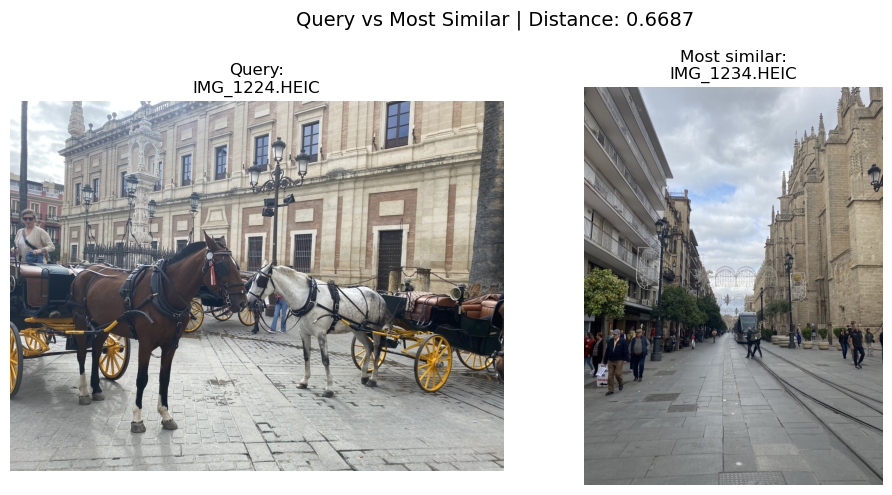

Query image: IMG_1224.HEIC
Most similar image: IMG_1234.HEIC
Similarity distance: 0.6687
- The distance is based on cosine distance between image embeddings.
- 0.0 means the vectors are identical (images are effectively the same).
- Smaller values (e.g., 0.1–0.3) = very similar images.
- Larger values (e.g., >0.7) = more different images.



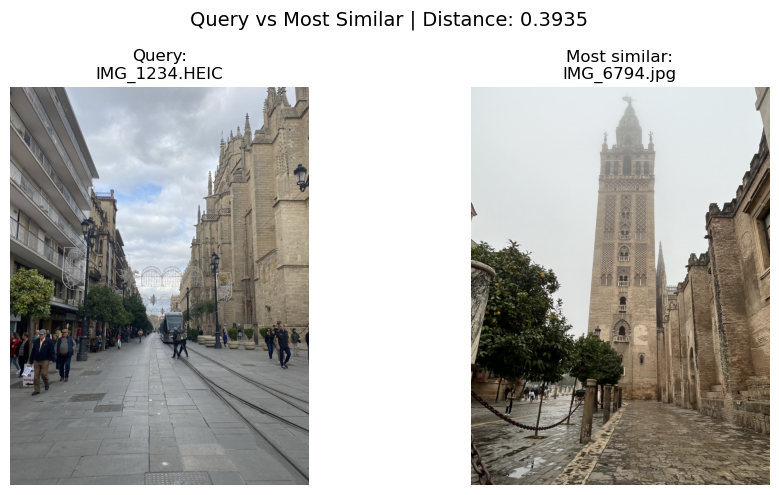

Query image: IMG_1234.HEIC
Most similar image: IMG_6794.jpg
Similarity distance: 0.3935
- The distance is based on cosine distance between image embeddings.
- 0.0 means the vectors are identical (images are effectively the same).
- Smaller values (e.g., 0.1–0.3) = very similar images.
- Larger values (e.g., >0.7) = more different images.



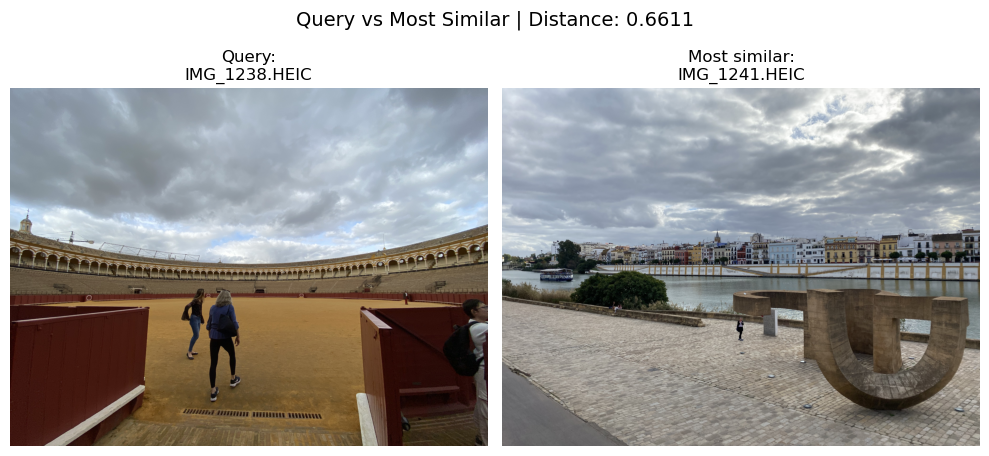

Query image: IMG_1238.HEIC
Most similar image: IMG_1241.HEIC
Similarity distance: 0.6611
- The distance is based on cosine distance between image embeddings.
- 0.0 means the vectors are identical (images are effectively the same).
- Smaller values (e.g., 0.1–0.3) = very similar images.
- Larger values (e.g., >0.7) = more different images.



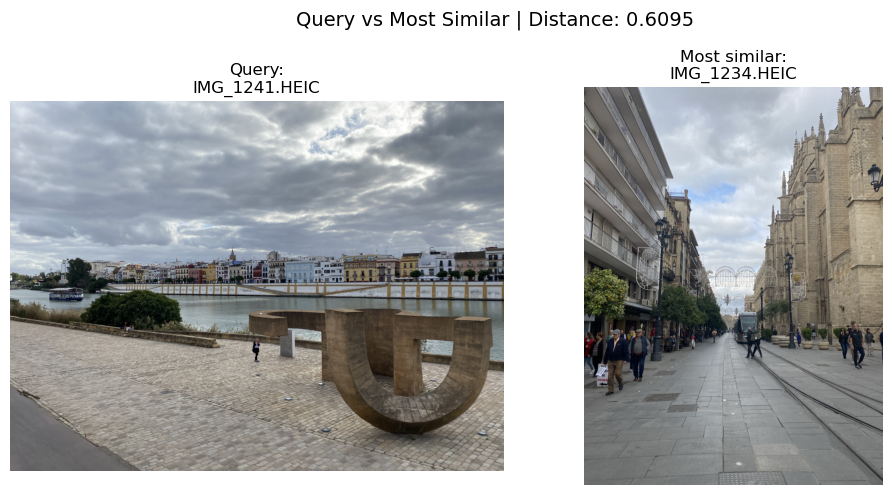

Query image: IMG_1241.HEIC
Most similar image: IMG_1234.HEIC
Similarity distance: 0.6095
- The distance is based on cosine distance between image embeddings.
- 0.0 means the vectors are identical (images are effectively the same).
- Smaller values (e.g., 0.1–0.3) = very similar images.
- Larger values (e.g., >0.7) = more different images.



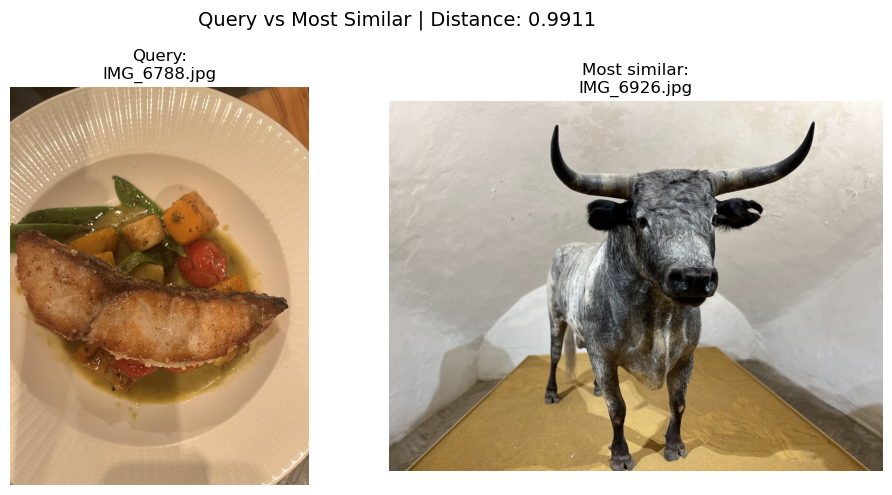

Query image: IMG_6788.jpg
Most similar image: IMG_6926.jpg
Similarity distance: 0.9911
- The distance is based on cosine distance between image embeddings.
- 0.0 means the vectors are identical (images are effectively the same).
- Smaller values (e.g., 0.1–0.3) = very similar images.
- Larger values (e.g., >0.7) = more different images.



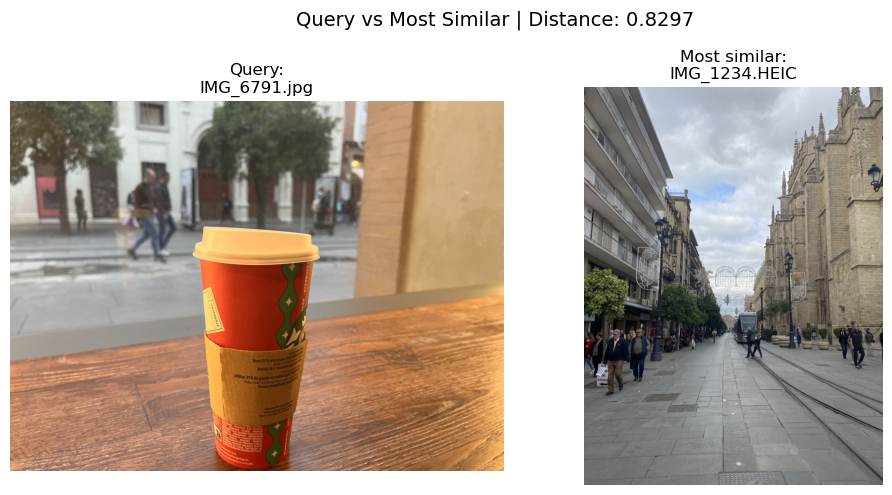

Query image: IMG_6791.jpg
Most similar image: IMG_1234.HEIC
Similarity distance: 0.8297
- The distance is based on cosine distance between image embeddings.
- 0.0 means the vectors are identical (images are effectively the same).
- Smaller values (e.g., 0.1–0.3) = very similar images.
- Larger values (e.g., >0.7) = more different images.



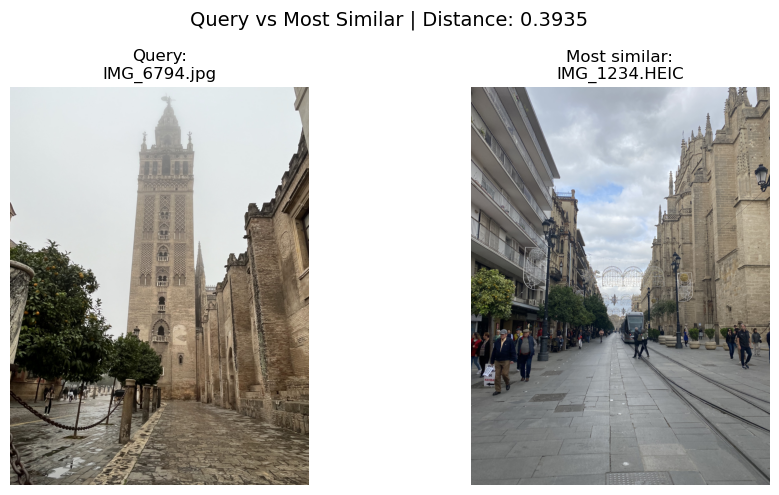

Query image: IMG_6794.jpg
Most similar image: IMG_1234.HEIC
Similarity distance: 0.3935
- The distance is based on cosine distance between image embeddings.
- 0.0 means the vectors are identical (images are effectively the same).
- Smaller values (e.g., 0.1–0.3) = very similar images.
- Larger values (e.g., >0.7) = more different images.



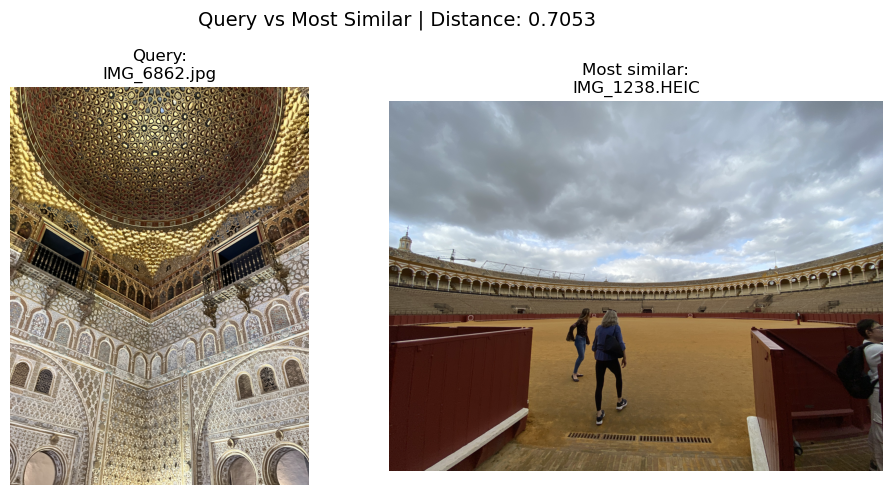

Query image: IMG_6862.jpg
Most similar image: IMG_1238.HEIC
Similarity distance: 0.7053
- The distance is based on cosine distance between image embeddings.
- 0.0 means the vectors are identical (images are effectively the same).
- Smaller values (e.g., 0.1–0.3) = very similar images.
- Larger values (e.g., >0.7) = more different images.



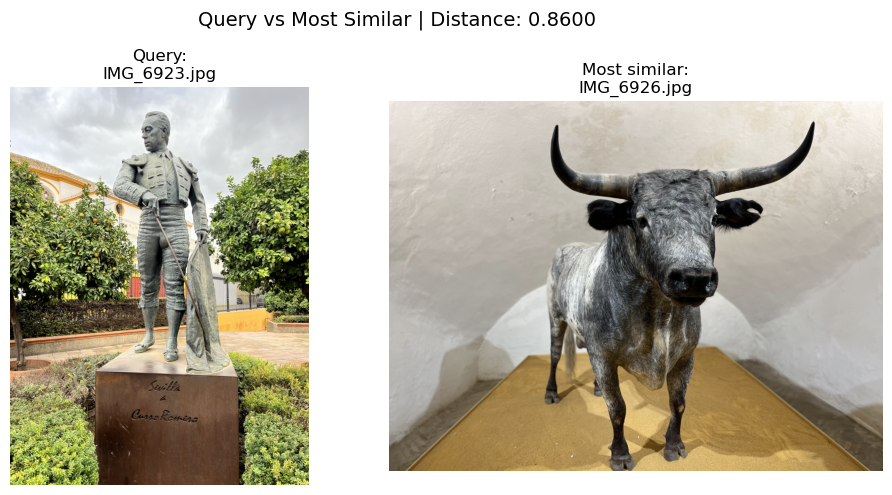

Query image: IMG_6923.jpg
Most similar image: IMG_6926.jpg
Similarity distance: 0.8600
- The distance is based on cosine distance between image embeddings.
- 0.0 means the vectors are identical (images are effectively the same).
- Smaller values (e.g., 0.1–0.3) = very similar images.
- Larger values (e.g., >0.7) = more different images.



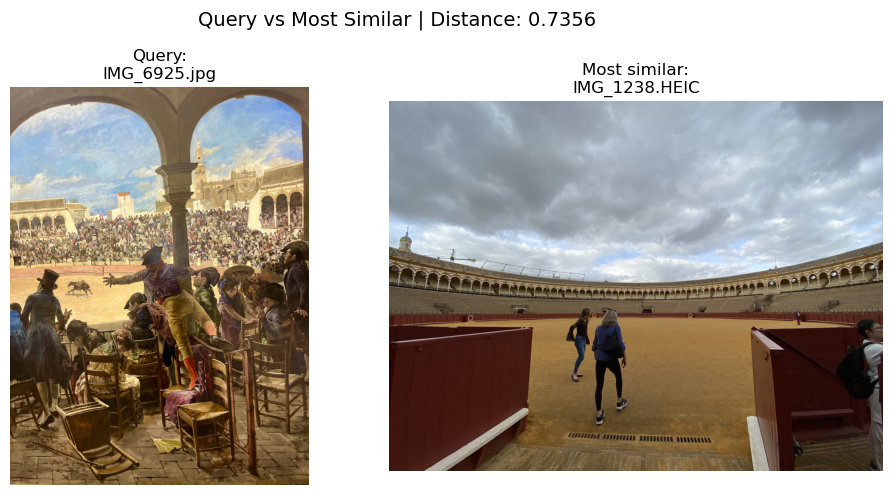

Query image: IMG_6925.jpg
Most similar image: IMG_1238.HEIC
Similarity distance: 0.7356
- The distance is based on cosine distance between image embeddings.
- 0.0 means the vectors are identical (images are effectively the same).
- Smaller values (e.g., 0.1–0.3) = very similar images.
- Larger values (e.g., >0.7) = more different images.



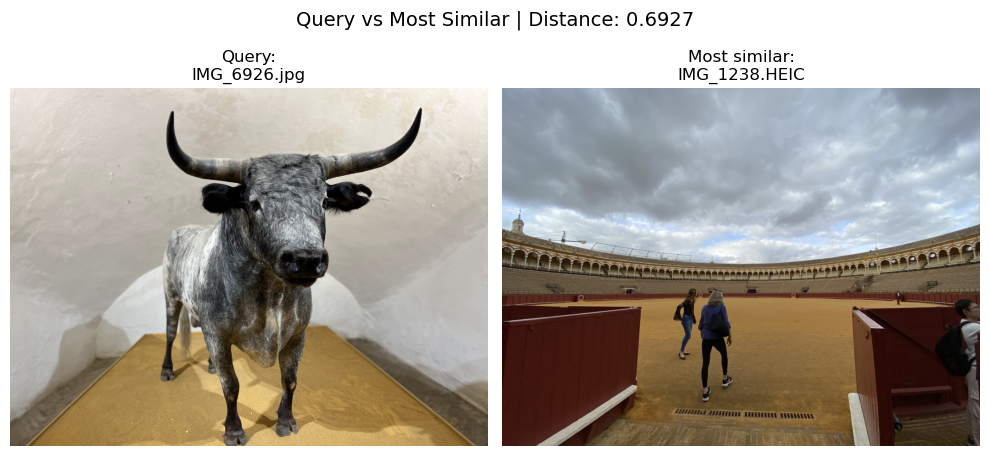

Query image: IMG_6926.jpg
Most similar image: IMG_1238.HEIC
Similarity distance: 0.6927
- The distance is based on cosine distance between image embeddings.
- 0.0 means the vectors are identical (images are effectively the same).
- Smaller values (e.g., 0.1–0.3) = very similar images.
- Larger values (e.g., >0.7) = more different images.



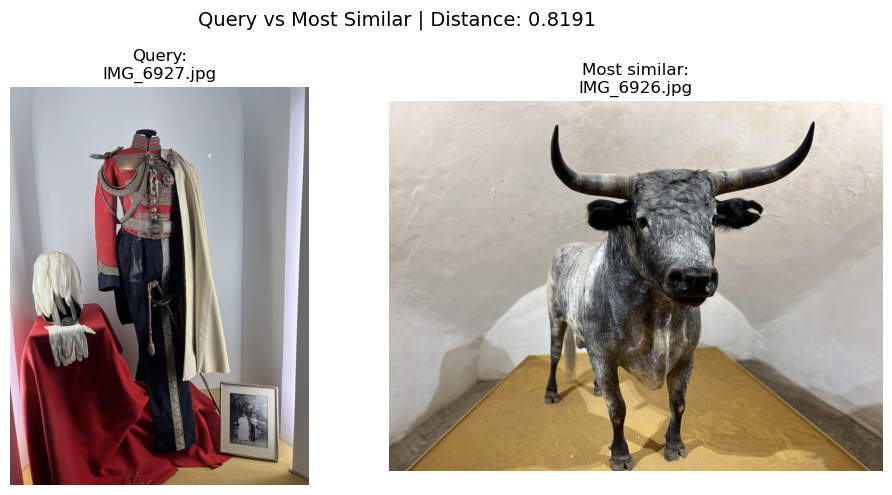

Query image: IMG_6927.jpg
Most similar image: IMG_6926.jpg
Similarity distance: 0.8191
- The distance is based on cosine distance between image embeddings.
- 0.0 means the vectors are identical (images are effectively the same).
- Smaller values (e.g., 0.1–0.3) = very similar images.
- Larger values (e.g., >0.7) = more different images.



In [17]:
import matplotlib.pyplot as plt
from PIL import Image


def compare_all_images(image_paths, top_k=2):
    """
    For each image in image_paths:
      - embed it
      - query ChromaDB for most similar images
      - pick the most similar *different* image
      - display both and print the distance (similarity score)
    """
    for img_path in image_paths:
        query_name = os.path.basename(img_path)

        # Load query image
        try:
            query_img = Image.open(img_path).convert("RGB")
        except Exception as e:
            print(f"Skipping {query_name} (cannot open image): {e}")
            continue

        # Get embedding for query
        query_embedding = embed_model.encode(
            query_img,
            convert_to_numpy=True,
            normalize_embeddings=True
        )

        # Query ChromaDB
        results = collection.query(
            query_embeddings=[query_embedding.tolist()],
            n_results=top_k  # will include itself + nearest neighbors
        )

        ids_list = results["ids"][0]
        metas_list = results["metadatas"][0]
        dists_list = results["distances"][0]

        # Find the closest image that is NOT the same file
        best_idx = None
        for i, cand_id in enumerate(ids_list):
            if cand_id != query_name:  # skip itself (distance ~0)
                best_idx = i
                break

        if best_idx is None:
            print(f"No different neighbor found for {query_name}, skipping.")
            continue

        best_id = ids_list[best_idx]
        best_meta = metas_list[best_idx]
        best_dist = dists_list[best_idx]
        best_path = best_meta["image_path"]

        # Load the best match image
        try:
            best_img = Image.open(best_path).convert("RGB")
        except Exception as e:
            print(f"Found neighbor {best_id} but could not open image: {e}")
            continue

        # Show images side by side
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        fig.suptitle(f"Query vs Most Similar | Distance: {best_dist:.4f}", fontsize=14)

        axes[0].imshow(query_img)
        axes[0].set_title(f"Query:\n{query_name}")
        axes[0].axis("off")

        axes[1].imshow(best_img)
        axes[1].set_title(f"Most similar:\n{best_id}")
        axes[1].axis("off")

        plt.tight_layout()
        plt.show()

        # Explain the distance in text
        print(f"Query image: {query_name}")
        print(f"Most similar image: {best_id}")
        print(
            f"Similarity distance: {best_dist:.4f}\n"
            "- The distance is based on cosine distance between image embeddings.\n"
            "- 0.0 means the vectors are identical (images are effectively the same).\n"
            "- Smaller values (e.g., 0.1–0.3) = very similar images.\n"
            "- Larger values (e.g., >0.7) = more different images.\n"
        )


#Run this to compare every image in the folder
compare_all_images(image_paths)



requirements: Ultralytics requirement ['pi-heif'] not found, attempting AutoUpdate...
WARNING Retry 1/2 failed: Command 'pip install --no-cache-dir "pi-heif" ' returned non-zero exit status 1.

requirements: AutoUpdate success  14.1s
WARNING requirements: Restart runtime or rerun command for updates to take effect

image 1/1 C:\Users\molly\Downloads\Dec 3 Images\IMG_1224.HEIC: 480x640 1 person, 2 horses, 222.6ms
Speed: 7.8ms preprocess, 222.6ms inference, 3.7ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\molly\Downloads\Dec 3 Images\IMG_1234.HEIC: 640x480 15 persons, 184.2ms
Speed: 8.5ms preprocess, 184.2ms inference, 9.5ms postprocess per image at shape (1, 3, 640, 480)


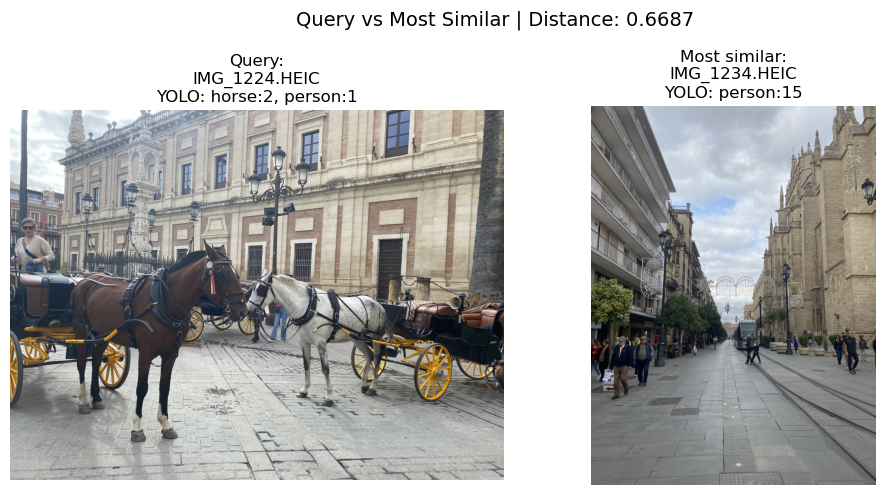

Query image: IMG_1224.HEIC
Most similar image: IMG_1234.HEIC
Similarity distance (CLIP cosine distance): 0.6687
- 0.0 means the embeddings are identical (images are extremely similar).
- Smaller values (e.g., 0.1–0.3) indicate very similar images.
- Larger values (e.g., >0.7) indicate more different images.
YOLO object summary for query:      horse:2, person:1
YOLO object summary for neighbor:   person:15



image 1/1 C:\Users\molly\Downloads\Dec 3 Images\IMG_1234.HEIC: 640x480 15 persons, 142.8ms
Speed: 7.6ms preprocess, 142.8ms inference, 9.9ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\molly\Downloads\Dec 3 Images\IMG_6794.jpg: 640x480 3 persons, 227.0ms
Speed: 6.1ms preprocess, 227.0ms inference, 7.0ms postprocess per image at shape (1, 3, 640, 480)


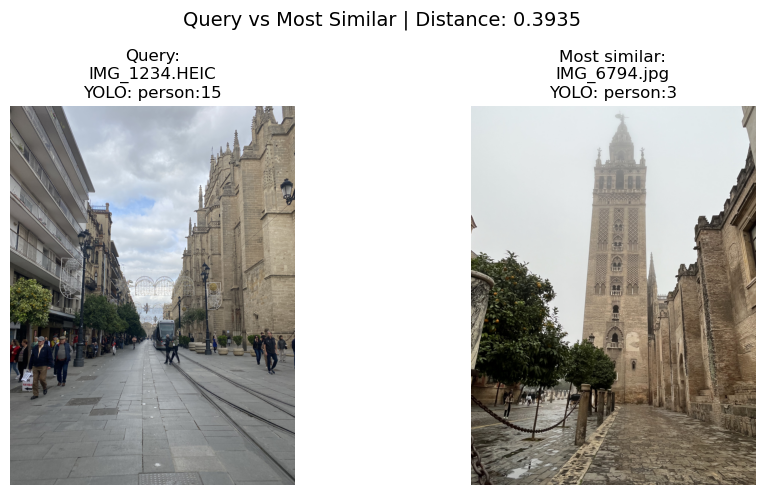

Query image: IMG_1234.HEIC
Most similar image: IMG_6794.jpg
Similarity distance (CLIP cosine distance): 0.3935
- 0.0 means the embeddings are identical (images are extremely similar).
- Smaller values (e.g., 0.1–0.3) indicate very similar images.
- Larger values (e.g., >0.7) indicate more different images.
YOLO object summary for query:      person:15
YOLO object summary for neighbor:   person:3



image 1/1 C:\Users\molly\Downloads\Dec 3 Images\IMG_1238.HEIC: 480x640 4 persons, 2 backpacks, 151.9ms
Speed: 7.2ms preprocess, 151.9ms inference, 6.1ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\molly\Downloads\Dec 3 Images\IMG_1241.HEIC: 480x640 1 person, 1 bench, 173.3ms
Speed: 5.6ms preprocess, 173.3ms inference, 8.7ms postprocess per image at shape (1, 3, 480, 640)


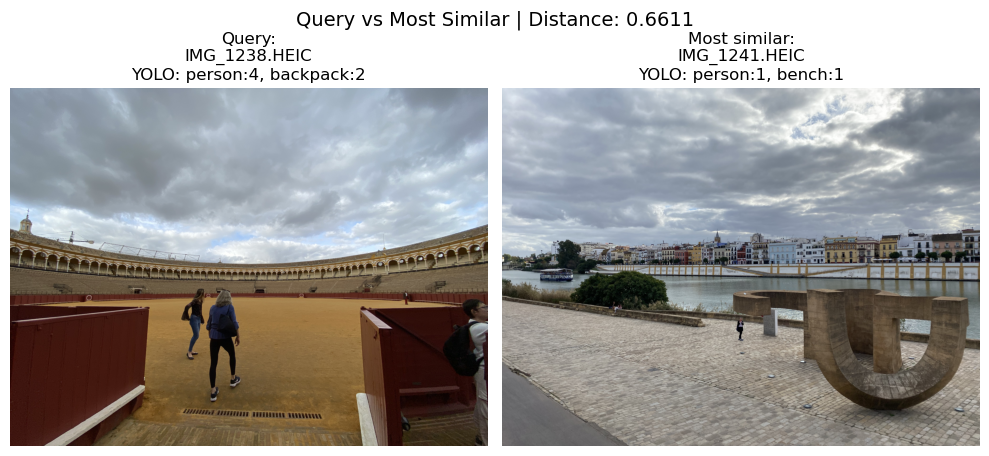

Query image: IMG_1238.HEIC
Most similar image: IMG_1241.HEIC
Similarity distance (CLIP cosine distance): 0.6611
- 0.0 means the embeddings are identical (images are extremely similar).
- Smaller values (e.g., 0.1–0.3) indicate very similar images.
- Larger values (e.g., >0.7) indicate more different images.
YOLO object summary for query:      person:4, backpack:2
YOLO object summary for neighbor:   person:1, bench:1



image 1/1 C:\Users\molly\Downloads\Dec 3 Images\IMG_1241.HEIC: 480x640 1 person, 1 bench, 86.4ms
Speed: 3.6ms preprocess, 86.4ms inference, 3.7ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\molly\Downloads\Dec 3 Images\IMG_1234.HEIC: 640x480 15 persons, 69.1ms
Speed: 3.3ms preprocess, 69.1ms inference, 4.5ms postprocess per image at shape (1, 3, 640, 480)


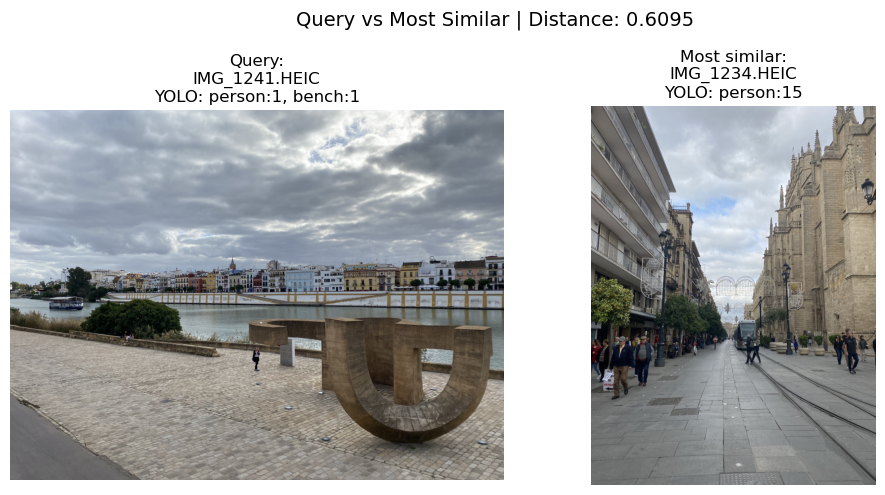

Query image: IMG_1241.HEIC
Most similar image: IMG_1234.HEIC
Similarity distance (CLIP cosine distance): 0.6095
- 0.0 means the embeddings are identical (images are extremely similar).
- Smaller values (e.g., 0.1–0.3) indicate very similar images.
- Larger values (e.g., >0.7) indicate more different images.
YOLO object summary for query:      person:1, bench:1
YOLO object summary for neighbor:   person:15



image 1/1 C:\Users\molly\Downloads\Dec 3 Images\IMG_6788.jpg: 640x480 2 carrots, 1 dining table, 97.8ms
Speed: 2.9ms preprocess, 97.8ms inference, 11.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\molly\Downloads\Dec 3 Images\IMG_6926.jpg: 480x640 1 sheep, 1 cow, 76.6ms
Speed: 3.8ms preprocess, 76.6ms inference, 4.2ms postprocess per image at shape (1, 3, 480, 640)


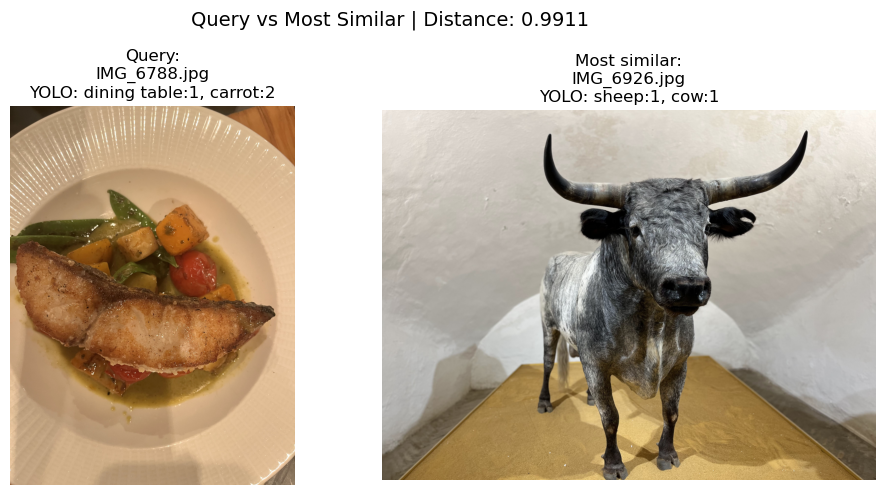

Query image: IMG_6788.jpg
Most similar image: IMG_6926.jpg
Similarity distance (CLIP cosine distance): 0.9911
- 0.0 means the embeddings are identical (images are extremely similar).
- Smaller values (e.g., 0.1–0.3) indicate very similar images.
- Larger values (e.g., >0.7) indicate more different images.
YOLO object summary for query:      dining table:1, carrot:2
YOLO object summary for neighbor:   sheep:1, cow:1



image 1/1 C:\Users\molly\Downloads\Dec 3 Images\IMG_6791.jpg: 480x640 6 persons, 1 cup, 1 dining table, 77.3ms
Speed: 2.5ms preprocess, 77.3ms inference, 5.9ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\molly\Downloads\Dec 3 Images\IMG_1234.HEIC: 640x480 15 persons, 80.5ms
Speed: 5.4ms preprocess, 80.5ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 480)


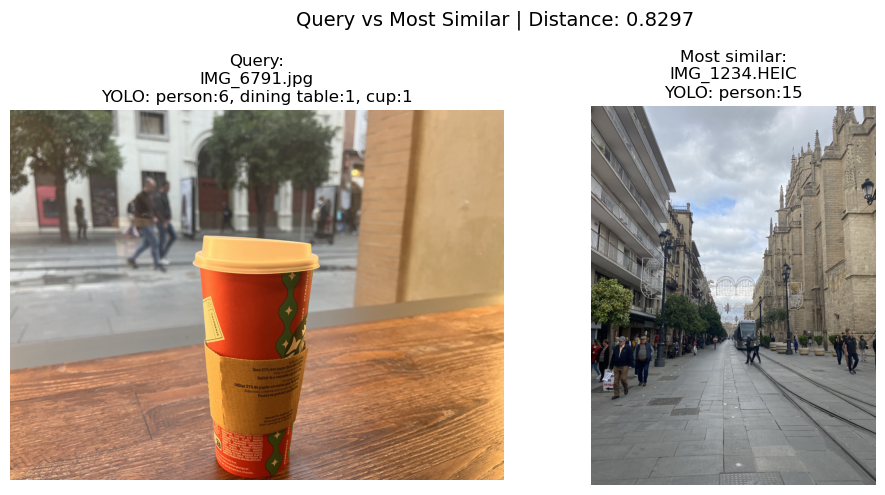

Query image: IMG_6791.jpg
Most similar image: IMG_1234.HEIC
Similarity distance (CLIP cosine distance): 0.8297
- 0.0 means the embeddings are identical (images are extremely similar).
- Smaller values (e.g., 0.1–0.3) indicate very similar images.
- Larger values (e.g., >0.7) indicate more different images.
YOLO object summary for query:      person:6, dining table:1, cup:1
YOLO object summary for neighbor:   person:15



image 1/1 C:\Users\molly\Downloads\Dec 3 Images\IMG_6794.jpg: 640x480 3 persons, 104.6ms
Speed: 2.7ms preprocess, 104.6ms inference, 6.7ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\molly\Downloads\Dec 3 Images\IMG_1234.HEIC: 640x480 15 persons, 98.9ms
Speed: 2.8ms preprocess, 98.9ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 480)


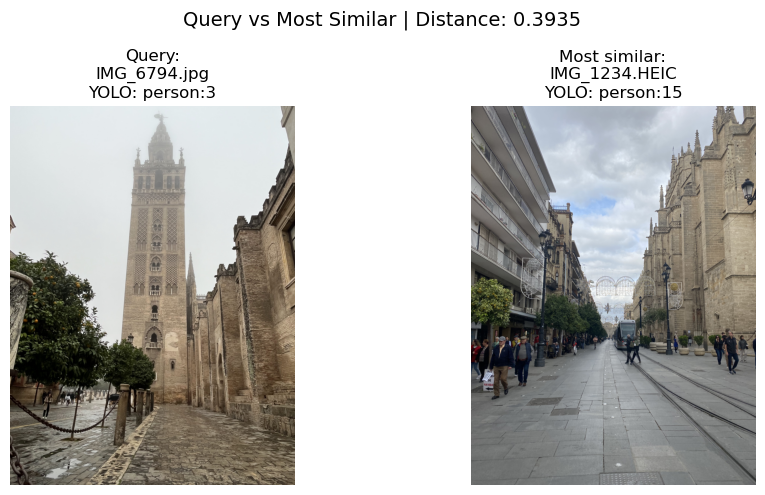

Query image: IMG_6794.jpg
Most similar image: IMG_1234.HEIC
Similarity distance (CLIP cosine distance): 0.3935
- 0.0 means the embeddings are identical (images are extremely similar).
- Smaller values (e.g., 0.1–0.3) indicate very similar images.
- Larger values (e.g., >0.7) indicate more different images.
YOLO object summary for query:      person:3
YOLO object summary for neighbor:   person:15



image 1/1 C:\Users\molly\Downloads\Dec 3 Images\IMG_6862.jpg: 640x480 (no detections), 78.7ms
Speed: 2.6ms preprocess, 78.7ms inference, 7.1ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\molly\Downloads\Dec 3 Images\IMG_1238.HEIC: 480x640 4 persons, 2 backpacks, 60.7ms
Speed: 3.1ms preprocess, 60.7ms inference, 2.8ms postprocess per image at shape (1, 3, 480, 640)


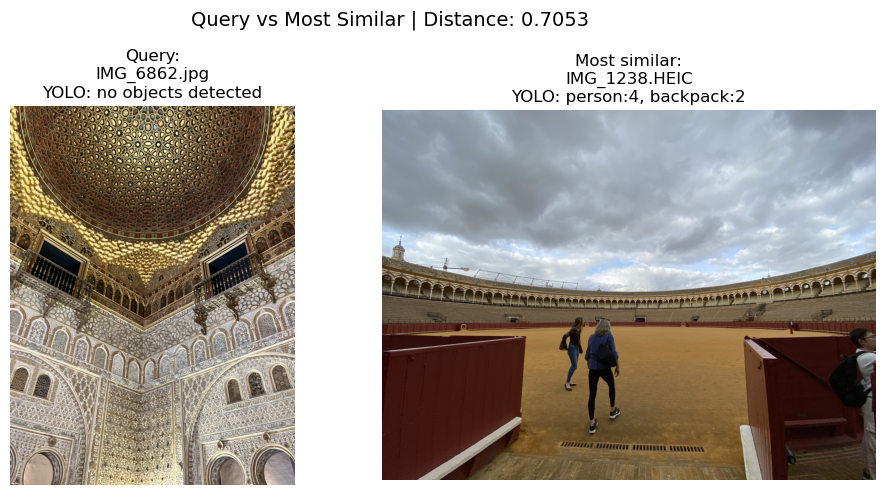

Query image: IMG_6862.jpg
Most similar image: IMG_1238.HEIC
Similarity distance (CLIP cosine distance): 0.7053
- 0.0 means the embeddings are identical (images are extremely similar).
- Smaller values (e.g., 0.1–0.3) indicate very similar images.
- Larger values (e.g., >0.7) indicate more different images.
YOLO object summary for query:      no objects detected
YOLO object summary for neighbor:   person:4, backpack:2



image 1/1 C:\Users\molly\Downloads\Dec 3 Images\IMG_6923.jpg: 640x480 1 person, 81.9ms
Speed: 2.9ms preprocess, 81.9ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\molly\Downloads\Dec 3 Images\IMG_6926.jpg: 480x640 1 sheep, 1 cow, 69.1ms
Speed: 2.9ms preprocess, 69.1ms inference, 3.6ms postprocess per image at shape (1, 3, 480, 640)


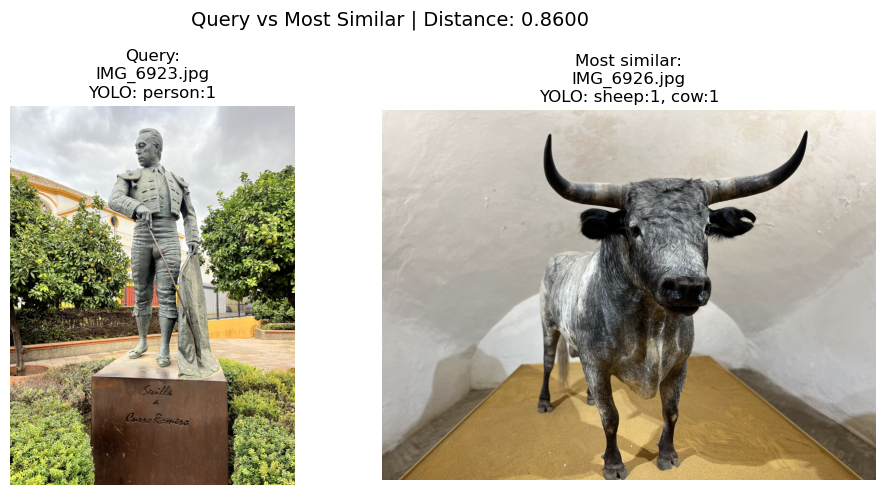

Query image: IMG_6923.jpg
Most similar image: IMG_6926.jpg
Similarity distance (CLIP cosine distance): 0.8600
- 0.0 means the embeddings are identical (images are extremely similar).
- Smaller values (e.g., 0.1–0.3) indicate very similar images.
- Larger values (e.g., >0.7) indicate more different images.
YOLO object summary for query:      person:1
YOLO object summary for neighbor:   sheep:1, cow:1



image 1/1 C:\Users\molly\Downloads\Dec 3 Images\IMG_6925.jpg: 640x480 10 persons, 1 horse, 3 chairs, 104.4ms
Speed: 3.1ms preprocess, 104.4ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\molly\Downloads\Dec 3 Images\IMG_1238.HEIC: 480x640 4 persons, 2 backpacks, 87.9ms
Speed: 2.8ms preprocess, 87.9ms inference, 3.1ms postprocess per image at shape (1, 3, 480, 640)


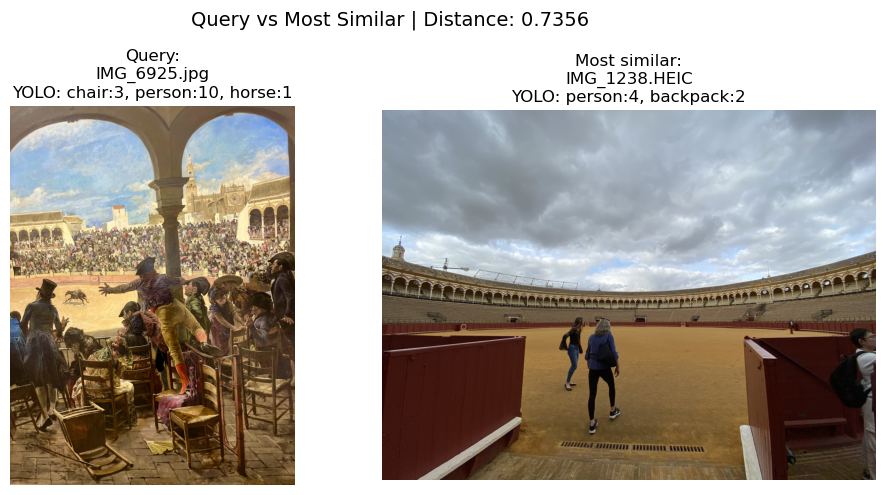

Query image: IMG_6925.jpg
Most similar image: IMG_1238.HEIC
Similarity distance (CLIP cosine distance): 0.7356
- 0.0 means the embeddings are identical (images are extremely similar).
- Smaller values (e.g., 0.1–0.3) indicate very similar images.
- Larger values (e.g., >0.7) indicate more different images.
YOLO object summary for query:      chair:3, person:10, horse:1
YOLO object summary for neighbor:   person:4, backpack:2



image 1/1 C:\Users\molly\Downloads\Dec 3 Images\IMG_6926.jpg: 480x640 1 sheep, 1 cow, 91.6ms
Speed: 2.6ms preprocess, 91.6ms inference, 4.7ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\molly\Downloads\Dec 3 Images\IMG_1238.HEIC: 480x640 4 persons, 2 backpacks, 93.1ms
Speed: 3.5ms preprocess, 93.1ms inference, 4.0ms postprocess per image at shape (1, 3, 480, 640)


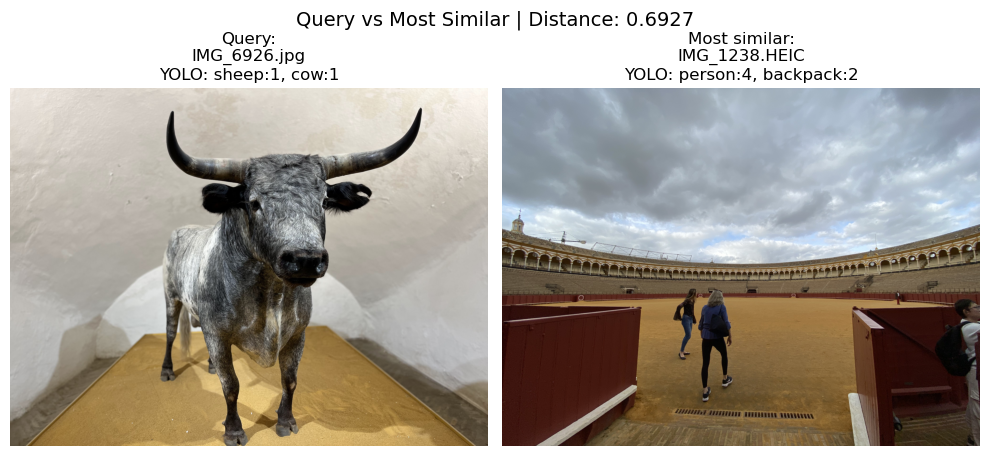

Query image: IMG_6926.jpg
Most similar image: IMG_1238.HEIC
Similarity distance (CLIP cosine distance): 0.6927
- 0.0 means the embeddings are identical (images are extremely similar).
- Smaller values (e.g., 0.1–0.3) indicate very similar images.
- Larger values (e.g., >0.7) indicate more different images.
YOLO object summary for query:      sheep:1, cow:1
YOLO object summary for neighbor:   person:4, backpack:2



image 1/1 C:\Users\molly\Downloads\Dec 3 Images\IMG_6927.jpg: 640x480 1 person, 54.6ms
Speed: 2.4ms preprocess, 54.6ms inference, 4.9ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\molly\Downloads\Dec 3 Images\IMG_6926.jpg: 480x640 1 sheep, 1 cow, 57.6ms
Speed: 2.8ms preprocess, 57.6ms inference, 3.2ms postprocess per image at shape (1, 3, 480, 640)


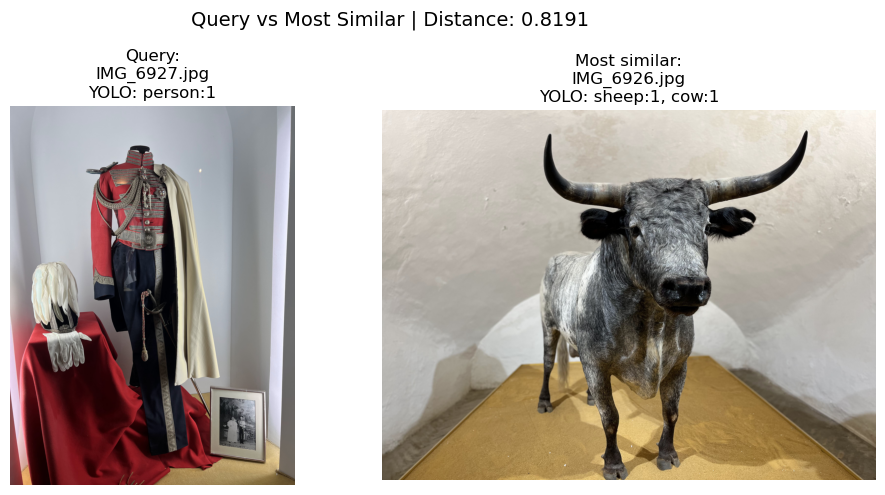

Query image: IMG_6927.jpg
Most similar image: IMG_6926.jpg
Similarity distance (CLIP cosine distance): 0.8191
- 0.0 means the embeddings are identical (images are extremely similar).
- Smaller values (e.g., 0.1–0.3) indicate very similar images.
- Larger values (e.g., >0.7) indicate more different images.
YOLO object summary for query:      person:1
YOLO object summary for neighbor:   sheep:1, cow:1




In [18]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, UnidentifiedImageError

from ultralytics import YOLO                 # Algorithm 1: YOLOv8
from sentence_transformers import SentenceTransformer  # Algorithm 2: CLIP

import chromadb

# 1) Load CLIP model (Algorithm 2)
embed_model = SentenceTransformer("clip-ViT-B-32")

# 2) Load YOLO model (Algorithm 1)
yolo_model = YOLO("yolov8n.pt")  # or yolov8s.pt if you prefer

# 3) ChromaDB client + collection (assuming you already indexed)
client = chromadb.PersistentClient(path=chroma_dir)
collection = client.get_or_create_collection(name="image_embeddings")
def summarize_yolo_objects(img_path, model):
    """
    Run YOLO on an image and return a short summary string like:
    'person:2, car:1'
    """
    results = model(img_path)
    boxes = results[0].boxes

    if len(boxes) == 0:
        return "no objects detected"

    cls_ids = boxes.cls.cpu().numpy().astype(int)
    names = results[0].names

    class_counts = {}
    for cid in cls_ids:
        label = names[int(cid)]
        class_counts[label] = class_counts.get(label, 0) + 1

    summary = ", ".join(f"{k}:{v}" for k, v in class_counts.items())
    return summary


def compare_all_images(image_paths, top_k=3):
    """
    For each image in image_paths, this function now uses TWO deep-learning algorithms:

      1) CLIP (ViT-B/32) - to embed the image and find the most similar image.
      2) YOLOv8         - to detect and summarize objects in both images.

    For each image:
      - embed it with CLIP
      - query ChromaDB for most similar images
      - pick the most similar *different* image
      - run YOLO on both images to summarize detected objects
      - display both and explain the similarity distance and object summaries
    """
    for img_path in image_paths:
        query_name = os.path.basename(img_path)

        # Load query image
        try:
            query_img = Image.open(img_path).convert("RGB")
        except (UnidentifiedImageError, OSError) as e:
            print(f"Skipping {query_name} (cannot open image): {e}")
            continue

        # ===== Algorithm 2: CLIP embedding for query image =====
        query_embedding = embed_model.encode(
            query_img,
            convert_to_numpy=True,
            normalize_embeddings=True
        )

        # Query ChromaDB (k-NN search in embedding space)
        results = collection.query(
            query_embeddings=[query_embedding.tolist()],
            n_results=top_k  # will include itself + nearest neighbors
        )

        ids_list = results["ids"][0]
        metas_list = results["metadatas"][0]
        dists_list = results["distances"][0]

        # Find the closest image that is NOT the same file
        best_idx = None
        for i, cand_id in enumerate(ids_list):
            if cand_id != query_name:  # skip itself (distance ~0)
                best_idx = i
                break

        if best_idx is None:
            print(f"No different neighbor found for {query_name}, skipping.")
            continue

        best_id = ids_list[best_idx]
        best_meta = metas_list[best_idx]
        best_dist = dists_list[best_idx]
        best_path = best_meta["image_path"]

        # Load the best match image
        try:
            best_img = Image.open(best_path).convert("RGB")
        except (UnidentifiedImageError, OSError) as e:
            print(f"Found neighbor {best_id} but could not open image: {e}")
            continue

        # ===== Algorithm 1: YOLO object detection on both images =====
        query_objects = summarize_yolo_objects(img_path, yolo_model)
        best_objects = summarize_yolo_objects(best_path, yolo_model)

        # Show images side by side
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        fig.suptitle(f"Query vs Most Similar | Distance: {best_dist:.4f}", fontsize=14)

        axes[0].imshow(query_img)
        axes[0].set_title(f"Query:\n{query_name}\nYOLO: {query_objects}")
        axes[0].axis("off")

        axes[1].imshow(best_img)
        axes[1].set_title(f"Most similar:\n{best_id}\nYOLO: {best_objects}")
        axes[1].axis("off")

        plt.tight_layout()
        plt.show()

        # Explain the similarity + detections in text
        print(f"Query image: {query_name}")
        print(f"Most similar image: {best_id}")
        print(f"Similarity distance (CLIP cosine distance): {best_dist:.4f}")
        print("- 0.0 means the embeddings are identical (images are extremely similar).")
        print("- Smaller values (e.g., 0.1–0.3) indicate very similar images.")
        print("- Larger values (e.g., >0.7) indicate more different images.")
        print(f"YOLO object summary for query:      {query_objects}")
        print(f"YOLO object summary for neighbor:   {best_objects}")
        print("\n" + "="*80 + "\n")


# Run this to compare every image in the folder using TWO algorithms
compare_all_images(image_paths)

